# Diplomatic Missions 1960 -> 2020

## Imports

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Exploraty Data Analysis

Load the dataset into a pandas dataframe for evaluation. 

In [3]:
df = pd.read_csv("../data/processed/diplometrics_processed.csv")
df.head()

,host_country,Destination Region,Destination Subregion,guest_country,Sending Region,Sending Subregion,year,location,embassy_code,focus_code,EmbassyFocus,level_of_representation,embassy_description
0,Afghanistan,Asia,Southern Asia,Czechoslovakia,Europe,Eastern Europe,1960,Afghanistan,5,1,51,0.75,Minister/Envoy
1,Afghanistan,Asia,Southern Asia,Egypt,Africa,Northern Africa,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
2,Afghanistan,Asia,Southern Asia,France,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
3,Afghanistan,Asia,Southern Asia,Germany,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
4,Afghanistan,Asia,Southern Asia,India,Asia,Southern Asia,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau


In [4]:
list(df.columns)

['host_country',
 'Destination Region',
 'Destination Subregion',
 'guest_country',
 'Sending Region',
 'Sending Subregion',
 'year',
 'location',
 'embassy_code',
 'focus_code',
 'EmbassyFocus',
 'level_of_representation',
 'embassy_description']

How has globalization affected diplomatic representation?

**Diplomatic Density**: Calculate the number of embassies hosted by each country (and globally) per year. Plot these trends over time to see how diplomatic engagement has changed. Are there any significant spikes or dips? Correlate these with major global events (wars, economic crises, etc.).

In [5]:
def get_country_df(country : str, data : pd.DataFrame):
    country_df = data[data["host_country"] == country]
    return country_df

afg = get_country_df("Afghanistan", df)
len(afg)

1627

In [6]:
len(df)

413582

In [7]:
def diplomatic_density(country_df : pd.DataFrame):
    # number per year
    yearly_missions = {}
    for year in np.unique(country_df["year"]):
        df_year = country_df[country_df["year"] == year]
        yearly_missions[int(year)] = len(df_year)
    
    avg_missions = sum(yearly_missions.values()) / len(yearly_missions)
    region_df = country_df["Destination Region"]
    country_region = region_df.iloc[0] if len(region_df) > 0 else "Unknown"
    return yearly_missions, avg_missions, country_region

missions, avg_missions, region = diplomatic_density(get_country_df("Afghanistan", df))

In [8]:
len(missions)

61

In [9]:
region

'Asia'

In [10]:
avg_missions

26.672131147540984

In [11]:
sum(missions.values())

1627

In [12]:
missions

{1960: 16,
 1961: 18,
 1962: 18,
 1963: 13,
 1964: 14,
 1965: 14,
 1966: 14,
 1967: 14,
 1968: 22,
 1969: 22,
 1970: 22,
 1971: 22,
 1972: 22,
 1973: 21,
 1974: 21,
 1975: 23,
 1976: 24,
 1977: 25,
 1978: 25,
 1979: 25,
 1980: 28,
 1981: 29,
 1982: 27,
 1983: 28,
 1984: 28,
 1985: 26,
 1986: 26,
 1987: 26,
 1988: 27,
 1989: 27,
 1990: 28,
 1991: 27,
 1992: 27,
 1993: 29,
 1994: 28,
 1995: 27,
 1996: 27,
 1997: 29,
 1998: 29,
 1999: 29,
 2000: 29,
 2001: 29,
 2002: 32,
 2003: 33,
 2004: 31,
 2005: 32,
 2006: 27,
 2007: 29,
 2008: 33,
 2009: 32,
 2010: 31,
 2011: 34,
 2012: 34,
 2013: 35,
 2014: 35,
 2015: 33,
 2016: 34,
 2017: 34,
 2018: 34,
 2019: 34,
 2020: 35}

Now we can use these functions to plot the missions over time for any country, the average missions for each country, and calculate and plot a yearly global average or total missions. 

In [13]:
# Loop through all host countries and get the average missions. 
# Plot histogram of average missions for all countries
# Later make a chloropleth map with this. 
all_avg_missions = []
all_missions = []
for country in np.unique(df["host_country"]):
    missions, avg_missions, region = diplomatic_density(get_country_df(country, df))
    all_missions.append(
        {
            "Country" : country,
            "Missions" : missions,
            "Region" : region
        }
    )
    all_avg_missions.append({
        "Country": country,
        "Avg. Missions": avg_missions,
        "Region": region
    })

missions_df = pd.DataFrame(all_avg_missions)
all_missions_df = pd.DataFrame(all_missions)

In [14]:
missions_df.head()

,Country,Avg. Missions,Region
0,Afghanistan,26.672131,Asia
1,Albania,22.633333,Europe
2,Algeria,70.706897,Africa
3,Andorra,2.333333,Europe
4,Angola,40.204545,Africa


In [15]:
all_missions_df.head()

,Country,Missions,Region
0,Afghanistan,"{1960: 16, 1961: 18, 1962: 18, 1963: 13, 1964:...",Asia
1,Albania,"{1960: 12, 1961: 13, 1962: 15, 1964: 21, 1965:...",Europe
2,Algeria,"{1962: 1, 1964: 40, 1965: 44, 1966: 41, 1967: ...",Africa
3,Andorra,"{1994: 2, 1995: 2, 1996: 2, 1997: 2, 1998: 2, ...",Europe
4,Angola,"{1977: 5, 1978: 11, 1979: 15, 1980: 17, 1981: ...",Africa


In [16]:
import seaborn as sns

In [17]:
def plot_diplomatic_missions(data : pd.DataFrame):
    """
    Plots a histogram of average diplomatic missions per country.

    Args:
        data: A dictionary where keys are country names and values are 
              the average number of diplomatic missions.
    """

    # We need to aggregate the regions to calculate the average missions per region. 
    new_data = {}
    for i in np.unique(data["Region"]):
        region_data = data[data['Region'] == i]
        avg_region_missions = sum(region_data["Avg. Missions"])
        new_data[i] = avg_region_missions
    
    regions = list(new_data.keys())
    avg_missions = list(new_data.values())

    new_df = pd.DataFrame({'Region': regions, 'Avg. Missions': avg_missions})


    # Sort the DataFrame by the average number of missions for better visualization
    df_sorted = new_df.sort_values('Avg. Missions', ascending=False)  # Sort from highest to lowest

    # Create the histogram plot
    plt.figure(figsize=(12, 9))  # Adjust figure size for better readability if needed
    sns.barplot(x='Region', y='Avg. Missions', data=df_sorted, color="#ff9cfd")    
    plt.xlabel("Region", fontsize=12)
    plt.ylabel("Average Number of Diplomatic Missions (1960-2020)", fontsize=12)
    plt.title("Average Diplomatic Missions per Region", fontsize=14, loc='center')

    plt.xticks(rotation=45, ha='right', fontsize=8)

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

#    plt.legend(title="Regions")

    plt.tight_layout()
    plt.show()
    return df_sorted


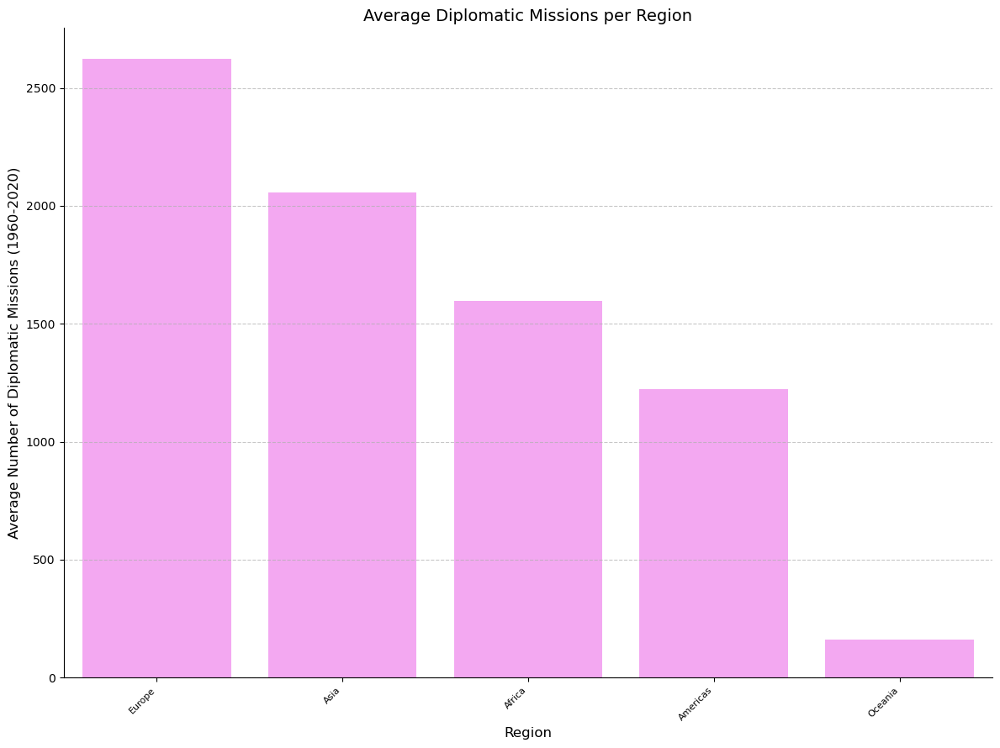

In [18]:
regions_df = plot_diplomatic_missions(data=missions_df)

In [19]:
regions_df

,Region,Avg. Missions
3,Europe,2623.199835
2,Asia,2057.936704
0,Africa,1597.199516
1,Americas,1221.810535
4,Oceania,161.906153


In [20]:
import geopandas as gpd

In [21]:
world = gpd.read_file("../data/world_map/ne_110m_admin_0_countries")  # Loads world shape file

In [22]:
np.unique(world["CONTINENT"])

array(['Africa', 'Antarctica', 'Asia', 'Europe', 'North America',
       'Oceania', 'Seven seas (open ocean)', 'South America'],
      dtype=object)

In [23]:
regions_df['Region'] = regions_df['Region'].replace({'Americas': 'North America'}) 
regions_df["Region"] = regions_df["Region"].replace({"Oceania": "Seven seas (open ocean)"})
#world['CONTINENT'] = world['CONTINENT'].replace({'Seven seas (disputed area)': 'Oceania'}) 

In [24]:
regions_df

,Region,Avg. Missions
3,Europe,2623.199835
2,Asia,2057.936704
0,Africa,1597.199516
1,North America,1221.810535
4,Seven seas (open ocean),161.906153


In [25]:
regions_df.loc[-1] = ["South America", regions_df[regions_df["Region"]=="North America"]["Avg. Missions"].iloc[0]]
regions_df.index += 1
regions_df = regions_df.sort_values("Avg. Missions", ascending=False)

In [26]:
regions_df

,Region,Avg. Missions
4,Europe,2623.199835
3,Asia,2057.936704
1,Africa,1597.199516
2,North America,1221.810535
0,South America,1221.810535
5,Seven seas (open ocean),161.906153


In [27]:
merged = world.merge(missions_df, left_on='CONTINENT', right_on='Region', how='left')

In [28]:
for region in np.unique(regions_df["Region"]):
    merged.loc[merged["CONTINENT"] == region, "Avg. Missions"] = regions_df[regions_df["Region"] == region]["Avg. Missions"].iloc[0]
    merged.loc[merged["CONTINENT"] == region, "Region"] = region

In [29]:
merged[merged["CONTINENT"] == "Seven seas (open ocean)"]

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry,Country,Avg. Missions,Region
672,Admin-0 country,3,6,France,FR1,1,2,Dependency,1,French Southern and Antarctic Lands,...,None,None,None,None,None,None,"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",NaN,161.906153,Seven seas (open ocean)


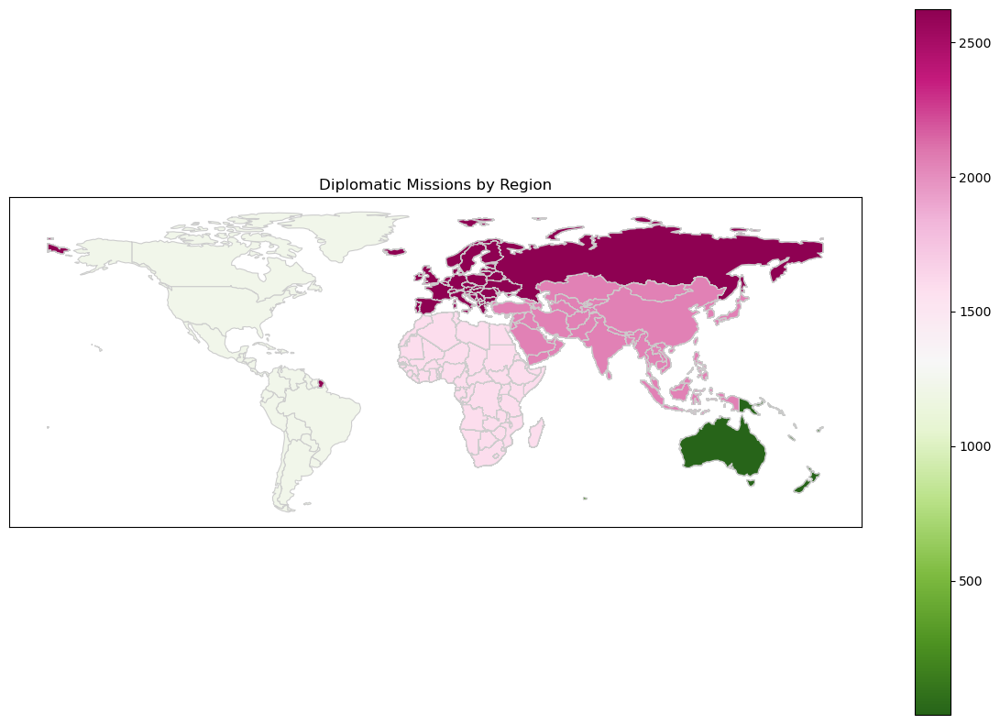

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(15, 10))  # Adjust figure size as needed
merged.plot(column='Avg. Missions', cmap='PiYG_r', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
plt.xticks([])
plt.yticks([])
ax.set_title('Diplomatic Missions by Region')
plt.show()

Now let's take a look at how a country's mission rates change over time. 

In [31]:
all_missions_df.head(20)

,Country,Missions,Region
0,Afghanistan,"{1960: 16, 1961: 18, 1962: 18, 1963: 13, 1964:...",Asia
1,Albania,"{1960: 12, 1961: 13, 1962: 15, 1964: 21, 1965:...",Europe
2,Algeria,"{1962: 1, 1964: 40, 1965: 44, 1966: 41, 1967: ...",Africa
3,Andorra,"{1994: 2, 1995: 2, 1996: 2, 1997: 2, 1998: 2, ...",Europe
4,Angola,"{1977: 5, 1978: 11, 1979: 15, 1980: 17, 1981: ...",Africa
5,Antigua and Barbuda,"{1984: 6, 1986: 2, 1987: 2, 1988: 3, 1989: 3, ...",Americas
6,Argentina,"{1960: 54, 1961: 56, 1962: 57, 1963: 53, 1964:...",Americas
7,Armenia,"{1993: 4, 1994: 9, 1995: 9, 1996: 10, 1997: 10...",Asia
8,Australia,"{1960: 33, 1961: 33, 1962: 33, 1963: 31, 1964:...",Oceania
9,Austria,"{1960: 41, 1961: 42, 1962: 42, 1963: 47, 1964:...",Europe


In [32]:
# Let's start with Angola. 
country = "Belgium"
plot_dict = all_missions_df[all_missions_df["Country"] == country]["Missions"]

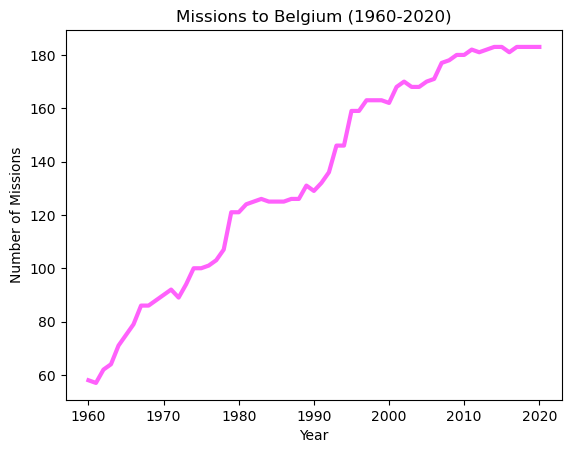

In [33]:
years = list(plot_dict.iloc[0].keys())
missions = list(plot_dict.iloc[0].values())

plt.plot(years, missions, color="#ff61fc", linewidth=3)
plt.xlabel("Year")
plt.ylabel("Number of Missions")
plt.title(f"Missions to {country} (1960-2020)")
plt.grid(False)
plt.show()

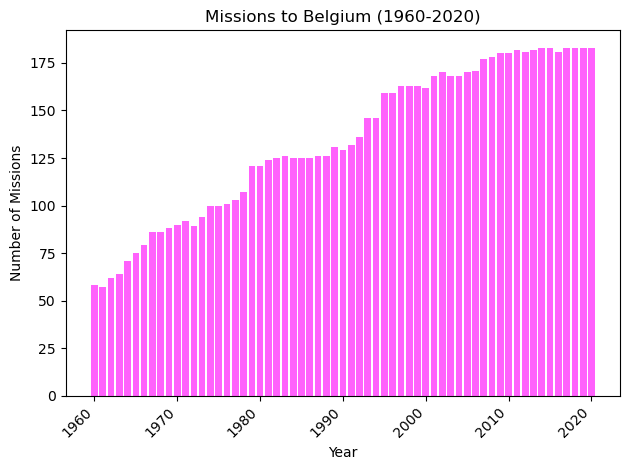

In [34]:
plt.bar(years, missions, color="#ff61fc")
plt.xlabel("Year")
plt.ylabel("Number of Missions")
plt.title(f"Missions to {country} (1960-2020)")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

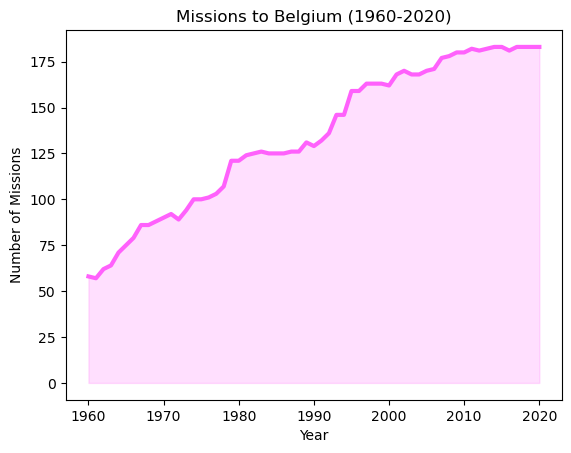

In [35]:
plt.plot(years, missions, color="#ff61fc", linewidth=3)
plt.fill_between(years, missions, color="#ff61fc", alpha=0.2)
plt.xlabel("Year")
plt.ylabel("Number of Missions")
plt.title(f"Missions to {country} (1960-2020)")
plt.grid(False)
plt.show()

In [36]:
import plotly.express as px

fig = px.line(x=years, y=missions, title=f'Missions to {country} (1960-2020)')
fig.update_xaxes(title_text='Year')
fig.update_yaxes(title_text='Number of Missions')
fig.show()

We can also look at multiple countries on the same plot for comparitive analysis! Let's write a general function to help us do this.

In [37]:
def plot_multiple_countries(countries : list[str], colors : list[str], data : pd.DataFrame, fill=True) -> None:
    for i in range(len(countries)):
        to_plot = data[data["Country"] == countries[i]]["Missions"]
        years = list(to_plot.iloc[0].keys())
        missions = list(to_plot.iloc[0].values())

        plt.plot(years, missions, color=colors[i], linewidth=3, label=countries[i])
        if fill:
            plt.fill_between(years, missions, color=colors[i], alpha=0.2)
    
    plt.xlabel("Year")
    plt.ylabel("Number of Missions")
    plt.title(f"Number of Missions to {[c + ', ' for c in countries[:-1]]}, and {countries[-1]}")
    plt.grid(False)
    plt.legend()
    plt.show()

In [38]:
import plotly.graph_objects as go
import pandas as pd

def plot_multiple_countries_plotly(countries: list[str], colors: list[str], data: pd.DataFrame) -> None:
    fig = go.Figure()

    for i in range(len(countries)):
        to_plot = data[data["Country"] == countries[i]]["Missions"]
        years = list(to_plot.iloc[0].keys())
        missions = list(to_plot.iloc[0].values())

        # Convert hex color to RGB
        hex_color = colors[i].lstrip('#')
        r, g, b = int(hex_color[0:2], 16), int(hex_color[2:4], 16), int(hex_color[4:6], 16)

        # Dynamic fill opacity for better contrast
        fill_opacity = 0.1 + (0.05 * i) # 0.1, 0.2, 0.3, 0.4, 0.5, 0.6...
        rgba_color = f"rgba({r}, {g}, {b}, {fill_opacity})"

        # Add main line trace
        fig.add_trace(go.Scatter(
            x=years, y=missions, mode='lines',
            line=dict(width=3, color=colors[i], shape='spline'),
            name=countries[i],
            fill='tozeroy',
            fillcolor=rgba_color,
            customdata=[countries[i]] * len(years),  # Assign per trace
            hoverinfo="x+y",
            hovertemplate="<b>Year: %{x}</b><br><b>%{customdata}</b>: %{y}<extra></extra>"
        ))

        # Add drop shadow (hidden in tooltip)
        fig.add_trace(go.Scatter(
            x=years, y=missions, mode='lines',
            line=dict(width=6, color=f"rgba({r}, {g}, {b}, 0.1)"),  
            name=f"{countries[i]} (shadow)", showlegend=False,
            hoverinfo="skip"  # Hide in tooltip
        ))

    # Update layout aesthetics
    fig.update_layout(
        title=dict(
            text=f"Number of Missions for {', '.join(countries[:-1])}, and {countries[-1]}",
            x=0.5,
            font=dict(size=18, family="Arial, sans-serif", color="#333")
        ),
        xaxis=dict(
            title="Year",
            tickangle=-45,
            showgrid=True,
            gridcolor="rgba(200, 200, 200, 0.3)",
            zeroline=False
        ),
        yaxis=dict(
            title="Number of Missions",
            showgrid=True,
            gridcolor="rgba(200, 200, 200, 0.3)",
            tickformat=',d'
        ),
        legend=dict(
            bgcolor="rgba(255,255,255,0.7)", borderwidth=1,
            font=dict(size=12)
        ),
        font=dict(size=12),
        plot_bgcolor="white",
        
        # Keep hovermode "x" instead of "x unified" to avoid duplicate years
        hovermode="x",
    )

    fig.show()


In [39]:
import plotly.graph_objects as go
import pandas as pd

def plot_grouped_bar_chart(countries: list[str], colors: list[str], data: pd.DataFrame) -> None:
    fig = go.Figure()

    years = sorted(list(set([year for country_data in data["Missions"] for year in country_data.keys()])))

    for i, country in enumerate(countries):
        missions_data = data[data["Country"] == country]["Missions"].iloc[0] if not data[data["Country"] == country].empty else {} # Handle missing countries
        missions = [missions_data.get(year, 0) for year in years] # Handle missing years

        fig.add_trace(go.Bar(
            x=years,  # All years for this country
            y=missions,
            name=country,  # Country in the legend
            marker_color=colors[i],
            hovertemplate=f"<b>Country:</b> {country}<br><b>Year:</b> %{{x}}<br><b>Missions:</b> %{{y}}<extra></extra>"
        ))

    fig.update_layout(
        title=f"Missions per Country Over Time",
        xaxis_title="Year",  # x-axis is Year
        yaxis_title="Number of Missions",
        legend_title="Country",  # Legend shows Country
        barmode='group'
    )
    fig.show()

In [40]:
import plotly
print(plotly.__version__)

6.0.0


Now we can compare two countries, like the United States and China for example. 

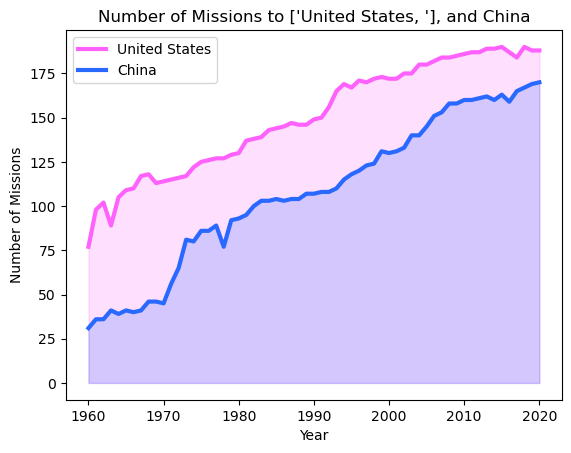

In [41]:
colors = ["#ff61fc", "#2969ff"]
countries = ["United States", "China"]

plot_multiple_countries(countries, colors, all_missions_df)

We can also plot three or more. Let's evaluate China, United States, France, Brazil, and Nigeria. 

In [42]:
all_missions_df.head()

,Country,Missions,Region
0,Afghanistan,"{1960: 16, 1961: 18, 1962: 18, 1963: 13, 1964:...",Asia
1,Albania,"{1960: 12, 1961: 13, 1962: 15, 1964: 21, 1965:...",Europe
2,Algeria,"{1962: 1, 1964: 40, 1965: 44, 1966: 41, 1967: ...",Africa
3,Andorra,"{1994: 2, 1995: 2, 1996: 2, 1997: 2, 1998: 2, ...",Europe
4,Angola,"{1977: 5, 1978: 11, 1979: 15, 1980: 17, 1981: ...",Africa


In [43]:
all_avg_missions_df = pd.DataFrame(all_avg_missions)
all_avg_missions_df.head()

,Country,Avg. Missions,Region
0,Afghanistan,26.672131,Asia
1,Albania,22.633333,Europe
2,Algeria,70.706897,Africa
3,Andorra,2.333333,Europe
4,Angola,40.204545,Africa


In [44]:
all_avg_missions_df[all_avg_missions_df["Country"] == "China"]["Avg. Missions"].iloc[0]

np.float64(107.68852459016394)

In [45]:

colors = [
    "#D9A694",  
    "#C5B1D4",  
    "#DEC87B", 
    "#E6B8AF",
    "#A8BFCF"  
]

colors.reverse()

pastel_colors = ["#ed64df", "#edc97b", "#80b1d3", "#fb8072", "#7570b3"]  # Soft pinks, yellows, blues
#pastel_colors.reverse()

countries = ["United States", "China", "France", "Brazil", "Nigeria"]
countries.sort(key=lambda x: all_avg_missions_df[all_avg_missions_df["Country"] == x]["Avg. Missions"].iloc[0], reverse=True)  # Sort descending


plot_multiple_countries_plotly(countries, pastel_colors, all_missions_df)

In [46]:
import random

In [79]:

color_list = [
    "#E9967A",  # Dark Salmon (Good starting point, not too light)
    "#F0E68C",  # Khaki (Distinct from the pinks/purples)
    "#90EE90",  # Light Green (Stands out well)
    "#00CED1",  # Dark Turquoise (Excellent contrast)
    "#4682B4",  # Steel Blue (Another strong contrast)
    "#8A2BE2",  # Blue Violet (Nice purple, good for gradients)
    "#DA70D6",  # Orchid (Another distinct purple)
    "#FF69B4",  # Hot Pink (Vibrant and recognizable)
    "#DC143C",  # Crimson (Rich red)
    "#800080"   # Purple (Deep, good for the tallest, opacity works well)
]

color_list.reverse()

countries = random.choices(all_missions_df["Country"], k=7)
countries.sort(key=lambda x: all_avg_missions_df[all_avg_missions_df["Country"] == x]["Avg. Missions"].iloc[0], reverse=True)  # Sort descending


plot_multiple_countries_plotly(countries, color_list, all_missions_df)

In [48]:
plot_grouped_bar_chart(countries, color_list, all_missions_df)

**Focus Evolution**: Track the evolution of EmbassyFocus over time. Are there shifts in the types of embassies countries are establishing (e.g., more economic-focused embassies in recent decades)? You could visualize this with stacked area charts showing the proportion of different embassy focuses each year.

In [49]:
EMBASSY_CODE_MAPPING = {
    6: "Ambassador/Nuncio/Secretary of People’s Bureau",
    5: "Minister/Envoy",
    4: "Charge d’affaires",
    3: "Interest Desk",
    2: "Interests Served by",
    1: "Unknown"
}


In [50]:
# Embassy focus over time for some country. 
# Function for Plotly stacked area chart
def plot_embassy_plotly(df, country):
    df_country = df[df['host_country'] == country]
    df_grouped = df_country.groupby(['year', 'embassy_description']).size().unstack(fill_value=0)

    fig = px.area(df_grouped, title=f"Embassy Code Distribution for {country} Over Time")
    fig.update_layout(xaxis_title="Year", yaxis_title="Count") 
    fig.show()


In [51]:
plot_embassy_plotly(df, "Italy")

In [52]:
import pandas as pd
import plotly.graph_objects as go

def plot_embassy_pie(df, country, years=[1960, 2020]):
    df_country = df[df['host_country'] == country]
    fig = go.Figure()

    for year in years:
        df_year = df_country[df_country['year'] == year]
        counts = df_year['embassy_description'].value_counts()

        fig.add_trace(go.Pie(
            labels=counts.index,
            values=counts.values,
            name=str(year),  # Year as the trace name
            hoverinfo='label+percent',
            textinfo='percent',
            domain={'x': [years.index(year) / len(years), (years.index(year) + 1) / len(years)],  # Position the pies horizontally
                    'y': [0, 1]}  # Pies take full vertical space
        ))

    fig.update_layout(title_text=f"Embassy Type Distribution for {country} ({', '.join(map(str, years))})",
                      annotations=[dict(text=str(year), x=(years.index(year) * 2 + 1) / (len(years) * 2), y=1.1, showarrow=False) for year in years]) # Add year labels above each pie
    fig.show()

In [53]:
random_country = random.choice(df["host_country"])

In [54]:
plot_embassy_pie(df, "Italy")

In [55]:
import plotly.graph_objects as go
import pandas as pd

def plot_nested_donut_chart(data: pd.DataFrame):
    """
    Plots a nested donut chart of diplomatic missions by region and country.

    Args:
        data: A pandas DataFrame with columns 'Region', 'Country', and 'Avg. Missions'.
    """

    # Aggregate data by region and country
    region_data = data.groupby(['Region'])['Avg. Missions'].sum().reset_index()
    country_data = data.groupby(['Region', 'Country'])['Avg. Missions'].sum().reset_index()

    # Define colors for regions (you can customize these)
    region_colors = {region: f"hsl({i*60}, 70%, 50%)" for i, region in enumerate(region_data['Region'].unique())}

    # Create the nested donut chart
    fig = go.Figure(go.Sunburst(
        labels=region_data['Region'].tolist() + country_data['Country'].tolist(),
        parents=[""] * len(region_data) + country_data['Region'].tolist(),
        values=region_data['Avg. Missions'].tolist() + country_data['Avg. Missions'].tolist(),
        branchvalues="total",  # Display the total value of each parent category
        marker=dict(
            colors=[region_colors[region] for region in region_data['Region']] + 
                   [region_colors[region] for region in country_data['Region']],
            colorscale='Blues',  # You can set a colorscale, but we're overriding with custom colors
        ),
        hovertemplate='<b>%{label}</b><br>Missions: %{value:.2f}<extra></extra>' 
    ))

    fig.update_layout(
        title="Diplomatic Missions by Region and Country",
        margin=dict(l=0, r=0, b=0, t=50),  # Adjust margins as needed
    )
    fig.show()

# Example usage (replace with your actual data):
plot_nested_donut_chart(missions_df)

**Representation Level Changes**: Analyze how the level_of_representation changes over time. Are countries increasingly establishing full embassies versus consulates or other forms of representation? Again, visualize this with time series plots.


In [56]:
df.head()

,host_country,Destination Region,Destination Subregion,guest_country,Sending Region,Sending Subregion,year,location,embassy_code,focus_code,EmbassyFocus,level_of_representation,embassy_description
0,Afghanistan,Asia,Southern Asia,Czechoslovakia,Europe,Eastern Europe,1960,Afghanistan,5,1,51,0.75,Minister/Envoy
1,Afghanistan,Asia,Southern Asia,Egypt,Africa,Northern Africa,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
2,Afghanistan,Asia,Southern Asia,France,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
3,Afghanistan,Asia,Southern Asia,Germany,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
4,Afghanistan,Asia,Southern Asia,India,Asia,Southern Asia,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau


In [57]:
portugal_df = df[df["host_country"] == "Portugal"]
average_representation_per_year = portugal_df.groupby("year")["level_of_representation"].mean()

In [58]:
import pandas as pd
import plotly.graph_objects as go

# ... (Your existing code to calculate average_representation_per_year) ...

fig = go.Figure()

fig.add_trace(go.Scatter(x=average_representation_per_year.index, 
                         y=average_representation_per_year.values,
                         mode='markers+lines',  # Show markers and lines
                         name='Portugal',  # Name of the trace (for legend if needed)
                         marker=dict(size=8, color='skyblue'),
                         line=dict(width=2, color='skyblue'),
                         hovertemplate='Year: %{x}<br>Average Representation: %{y:.2f}<extra></extra>'))  # Customize hover text

fig.update_layout(title='Average Level of Representation in Portugal per Year',
                  xaxis_title='Year',
                  yaxis_title='Average Level of Representation',
                  font=dict(size=12),
                  template="plotly_white")  # Use a white background for cleaner look

fig.show()

In [59]:
average_representation_by_country_year = df.groupby(["host_country", "year"])["level_of_representation"].mean()


In [60]:
import pandas as pd
import plotly.graph_objects as go

# ... (Your existing code to calculate average_representation_by_country_year) ...

fig = go.Figure()

for country in average_representation_by_country_year.index.get_level_values(0).unique():
    country_data = average_representation_by_country_year[country]
    fig.add_trace(go.Scatter(x=country_data.index, 
                             y=country_data.values,
                             mode='markers+lines',
                             name=country,
                             visible="legendonly" if country != "Portugal" else True, #Only show Portugal by default
                             hovertemplate='Year: %{x}<br>Average Representation: %{y:.2f}<extra></extra>'))

fig.update_layout(title='Average Level of Representation by Country and Year',
                  yaxis_title='Average Level of Representation',
                  font=dict(size=12),
                  template="plotly_white",
                  updatemenus=[
                      dict(
                          active=0,
                          buttons=[
                              dict(label="All",
                                   method="restyle",
                                   args=["visible", [True] * len(fig.data)]),
                              *[dict(label=country,
                                      method="restyle",
                                      args=["visible", [True if d.name == country else "legendonly" for d in fig.data]])
                                for country in average_representation_by_country_year.index.get_level_values(0).unique()]
                          ]
                      )
                  ])

fig.show()

In [61]:
import pandas as pd
import plotly.graph_objects as go

# ... (Your existing code to calculate average_representation_by_country_year) ...

fig = go.Figure()

for country in average_representation_by_country_year.index.get_level_values(0).unique():
    country_data = average_representation_by_country_year[country]
    fig.add_trace(go.Scatter(x=country_data.index, 
                             y=country_data.values,
                             mode='lines',
                             stackgroup='one',  # Important for stacking areas
                             name=country,
                             hovertemplate='Year: %{x}<br>Average Representation: %{y:.2f}<extra></extra>'))

fig.update_layout(title='Cumulative Average Level of Representation by Country and Year',
                  yaxis_title='Average Level of Representation',
                  font=dict(size=12),
                  template="plotly_white")

fig.show()

**Network Analysis**: Create a network graph where nodes are countries and edges represent the existence of a diplomatic mission between them. You can analyze network metrics like centrality (which countries are most influential in the diplomatic network?), community detection (are there clusters of countries with strong diplomatic ties?), and path length (how many steps does it take for two countries to be connected diplomatically?).

In [62]:
df.head()

,host_country,Destination Region,Destination Subregion,guest_country,Sending Region,Sending Subregion,year,location,embassy_code,focus_code,EmbassyFocus,level_of_representation,embassy_description
0,Afghanistan,Asia,Southern Asia,Czechoslovakia,Europe,Eastern Europe,1960,Afghanistan,5,1,51,0.75,Minister/Envoy
1,Afghanistan,Asia,Southern Asia,Egypt,Africa,Northern Africa,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
2,Afghanistan,Asia,Southern Asia,France,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
3,Afghanistan,Asia,Southern Asia,Germany,Europe,Western Europe,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau
4,Afghanistan,Asia,Southern Asia,India,Asia,Southern Asia,1960,Afghanistan,6,1,61,1.00,Ambassador/Nuncio/Secretary of People’s Bureau


In [63]:
EMBASSY_CODE_MAPPING = {
    6: "Ambassador/Nuncio/Secretary of People’s Bureau",
    5: "Minister/Envoy",
    4: "Charge d’affaires",
    3: "Interest Desk",
    2: "Interests Served by",
    1: "Unknown"
}


In [64]:
missions_df.head()

,Country,Avg. Missions,Region
0,Afghanistan,26.672131,Asia
1,Albania,22.633333,Europe
2,Algeria,70.706897,Africa
3,Andorra,2.333333,Europe
4,Angola,40.204545,Africa


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

def create_mission_network(df, year):
    """Creates a NetworkX graph for a given year."""
    year_data = df[df['year'] == year]
    graph = nx.Graph()  # Or nx.DiGraph() if missions are directional

    for _, row in year_data.iterrows():
        country1 = row['guest_country']
        country2 = row['host_country']
        mission_type = row['embassy_description']

        graph.add_edge(country1, country2, type=mission_type)  # Add edge with mission type

    return graph

def plot_network(graph, year, layout=None):
    """Plots the NetworkX graph with colored edges."""
    if layout is None:
      layout = nx.spring_layout(graph, seed=42) #Consistent layout across years

    edge_colors = [
        {"Ambassador/Nuncio/Secretary of People’s Bureau": 'red', "Minister/Envoy": 'blue', "Charge d’affaires": 'green', "Interest Desk": "pink", "Interests Served by": "purple", "Unknown": "purple"}.get(data['type'], 'gray')
        for u, v, data in graph.edges(data=True)
    ]

    nx.draw(graph, layout, with_labels=True, node_size=200, node_color="skyblue",
            edge_color=edge_colors, font_size=8, alpha=0.7, width=0.8)

    plt.title(f"Diplomatic Mission Network - {year}")
    plt.show()

# Example usage:
years = df['year'].unique()  # Get all unique years in your data

for year in years:
    graph = create_mission_network(df, year)
    plot_network(graph, year) # plots each year individually

# Analyzing Graph Evolution (Example)
for year in years:
    graph = create_mission_network(df, year)
    print(f"Year: {year}")
    print(f"Number of Nodes: {graph.number_of_nodes()}")
    print(f"Number of Edges: {graph.number_of_edges()}")
    # Add more analysis as needed (e.g., connected components, centrality)
    # nx.connected_components(graph)
    # nx.degree_centrality(graph)
    print("-" * 20)

In [66]:
print(list(world.columns))

['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3', 'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN', 'ADM0_A3', 'GEOU_DIF', 'GEOUNIT', 'GU_A3', 'SU_DIF', 'SUBUNIT', 'SU_A3', 'BRK_DIFF', 'NAME', 'NAME_LONG', 'BRK_A3', 'BRK_NAME', 'BRK_GROUP', 'ABBREV', 'POSTAL', 'FORMAL_EN', 'FORMAL_FR', 'NAME_CIAWF', 'NOTE_ADM0', 'NOTE_BRK', 'NAME_SORT', 'NAME_ALT', 'MAPCOLOR7', 'MAPCOLOR8', 'MAPCOLOR9', 'MAPCOLOR13', 'POP_EST', 'POP_RANK', 'POP_YEAR', 'GDP_MD', 'GDP_YEAR', 'ECONOMY', 'INCOME_GRP', 'FIPS_10', 'ISO_A2', 'ISO_A2_EH', 'ISO_A3', 'ISO_A3_EH', 'ISO_N3', 'ISO_N3_EH', 'UN_A3', 'WB_A2', 'WB_A3', 'WOE_ID', 'WOE_ID_EH', 'WOE_NOTE', 'ADM0_ISO', 'ADM0_DIFF', 'ADM0_TLC', 'ADM0_A3_US', 'ADM0_A3_FR', 'ADM0_A3_RU', 'ADM0_A3_ES', 'ADM0_A3_CN', 'ADM0_A3_TW', 'ADM0_A3_IN', 'ADM0_A3_NP', 'ADM0_A3_PK', 'ADM0_A3_DE', 'ADM0_A3_GB', 'ADM0_A3_BR', 'ADM0_A3_IL', 'ADM0_A3_PS', 'ADM0_A3_SA', 'ADM0_A3_EG', 'ADM0_A3_MA', 'ADM0_A3_PT', 'ADM0_A3_AR', 'ADM0_A3_JP', 'ADM0_A3_KO', 'ADM0_A3_VN', 'ADM0_A3_TR', 'AD

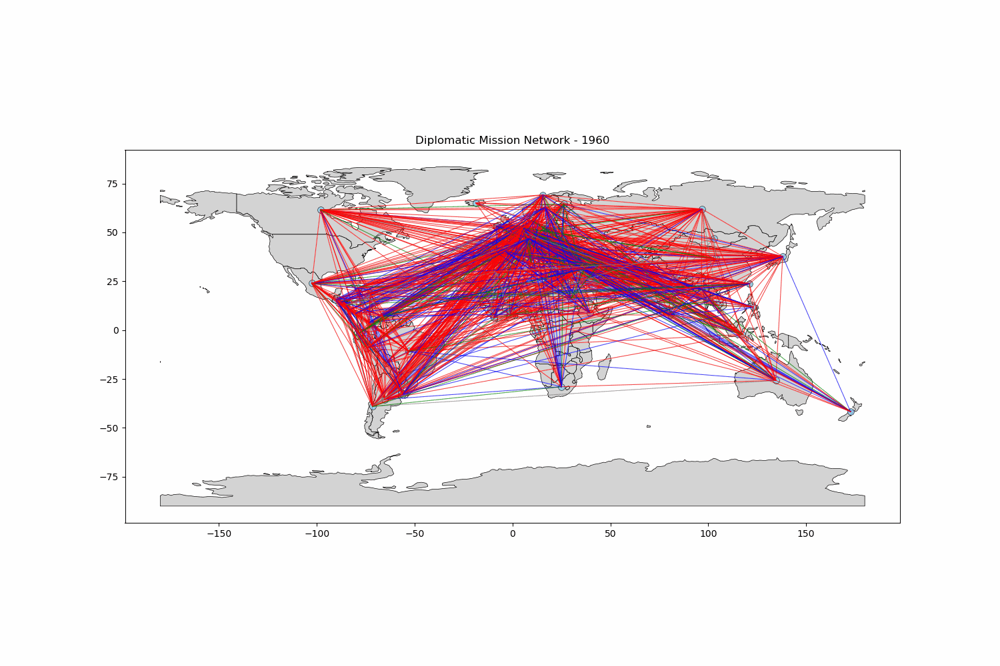

In [71]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import geopandas as gpd
import imageio

def create_mission_network(df, year):
    """Creates a NetworkX graph for a given year."""
    year_data = df[df['year'] == year]
    graph = nx.Graph()  # Or nx.DiGraph() if missions are directional

    for _, row in year_data.iterrows():
        country1 = row['guest_country']
        country2 = row['host_country']
        mission_type = row['embassy_description']

        graph.add_edge(country1, country2, type=mission_type)  # Add edge with mission type

    return graph

def plot_network_on_map(graph, year, world_shapefile):
    """Plots the network on a world map."""

    fig, ax = plt.subplots(figsize=(15, 10))  # Adjust figure size as needed
    world_shapefile.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)  # Plot map

    # 2. Get Node Positions (Long/Lat):
    node_positions = {}
    for country in graph.nodes():
        try:
            country_geometry = world_shapefile[world_shapefile['NAME'] == country]['geometry'].iloc[0]
            centroid = country_geometry.centroid
            node_positions[country] = (centroid.x, centroid.y)
        except IndexError:
            print(f"Warning: Country '{country}' not found in shapefile. Skipping.")
            continue  # Skip if country not found

    # 3. Draw Edges:
    edge_colors = [
        {"Ambassador/Nuncio/Secretary of People’s Bureau": 'red', "Minister/Envoy": 'blue', "Charge d’affaires": 'green', "Interest Desk": "pink", "Interests Served by": "purple", "Unknown": "gray"}.get(data['type'], 'gray')
        for u, v, data in graph.edges(data=True)
    ]
    for u, v, data in graph.edges(data=True):
        if u in node_positions and v in node_positions:  # Make sure both nodes are on the map
            x1, y1 = node_positions[u]
            x2, y2 = node_positions[v]
            ax.plot([x1, x2], [y1, y2], color=edge_colors[list(graph.edges).index((u, v))], linewidth=0.8, alpha=0.7)

    # 4. Draw Nodes:
    for country, (x, y) in node_positions.items():
        ax.scatter(x, y, s=50, color='skyblue', edgecolors='black', linewidth=0.5, alpha=0.8, label=country)  # Adjust node size (s)

    ax.set_title(f"Diplomatic Mission Network - {year}")
    ax.set_aspect('equal')  # Important for correct map proportions
    filename = f'mission_network_{year}.png'  # Create a filename for each plot
    plt.savefig(filename)  # Save the plot as a PNG file
#    plt.legend(fontsize=8, markerscale=0.5)  # Add legend with smaller markers
#    plt.show()
    plt.close()

years = df['year'].unique()  # Get all unique years in your data

#for year in years:
#    graph = create_mission_network(df, year)
#    plot_network_on_map(graph, year, world) # Use the map plotting function

# Analyzing Graph Evolution (Example)
#for year in years:
#    graph = create_mission_network(df, year)
#    print(f"Year: {year}")
#    print(f"Number of Nodes: {graph.number_of_nodes()}")
#    print(f"Number of Edges: {graph.number_of_edges()}")
    # Add more analysis as needed (e.g., connected components, centrality)
    # nx.connected_components(graph)
    # nx.degree_centrality(graph)
#    print("-" * 20)


filenames = []  # List to store filenames of individual plots

for year in years:
    graph = create_mission_network(df, year)
    plot_network_on_map(graph, year, world)  # Your plotting function

    filename = f'mission_network_{year}.png'  # Create a filename for each plot
#    plt.savefig(filename)  # Save the plot as a PNG file
    filenames.append(filename)  # Add filename to the list
#    plt.close()  # Close the figure to prevent it from displaying separately

# Create the GIF from the saved PNG files
with imageio.get_writer('mission_network_animation.gif', mode='I', duration=1) as writer:  # Adjust duration as needed
    for filename in filenames:
        image = imageio.v2.imread(filename)
        writer.append_data(image)

# Display GIF in Jupyter Notebook
from IPython.display import Image
with open('mission_network_animation.gif', 'rb') as f:
    display(Image(data=f.read(), format='gif'))

# (Optional) Remove individual PNG files if you don't need them
import os
for filename in filenames:
    os.remove(filename)


**Bilateral Relationships**: Focus on specific pairs of countries. How has their diplomatic relationship evolved over time? When did they establish an embassy? Has the level of representation changed?